## PURPOSE OF THE NOTEBOOK
The aim of this notebook is to identify common niches across GB samples and characterize them

# Import all libraries & functions needed

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as st
import warnings
warnings.filterwarnings('ignore')
import squidpy as sq
import scanpy as sc
import os 
import seaborn as sns
import networkx as nx
from scipy.spatial import ConvexHull, convex_hull_plot_2d
import numpy as np
from tqdm import tqdm

In [ ]:
def format_data_neighs(adata,sname,condit,neighs=10):
    adata.obsm["spatial"]=np.array([adata.obs.X,adata.obs.Y]).transpose().astype('float64')
    adata.obs['sample']=sname
    adata_copy_int=adata
    sq.gr.spatial_neighbors(adata_copy_int,n_neighs=neighs)
    result=np.zeros([adata.shape[0],len(adata_copy_int.obs[sname].unique())])
    n=0
    tr=adata_copy_int.obsp['spatial_distances'].transpose()
    tr2=tr>0
    from tqdm import tqdm
    for g in tqdm(adata_copy_int.obs[sname].unique()):
        epv=adata_copy_int.obs[sname]==g*1
        opv=list(epv*1)
        result[:,n]=tr2.dot(opv)
        n=n+1
    expmat=pd.DataFrame(result,columns=adata_copy_int.obs[sname].unique())
    adata1=sc.AnnData(expmat,obs=adata.obs)
    adata1.obs['sample']=condit
    adata1.obs['condition']=condit
    return adata1



# first we load the dataset

In [2]:
general_path='/media/sergio/GBX/GBmap samples'
global_path=general_path+'ISS_samples/'
adata=sc.read(general_path+'/ISS_global_analysis/all_samples_with_colors.h5ad') # should be with colors

We re-define each cell based on the cellular identify of the microenvironment of individual cells

In [328]:
annot='level4' #level of annotation to work on
an_concat=[]
for ss in adata.obs['sample'].unique():
    asub=adata[adata.obs['sample']==ss]
    adataneigh=format_data_neighs(asub,annot,ss,neighs=15)
    an_concat.append(adataneigh)
adataneigh=sc.concat(an_concat)
adataneigh=sc.concat(an_concat)
adataneigh.obsm['spatial']=adata.obsm['spatial']

We next preprocess and recluster cells acording to its neighborhood composition

In [331]:
sc.pp.filter_cells(adataneigh,min_genes=3)
adataneigh.raw=adataneigh
sc.pp.log1p(adataneigh)

In [334]:
sc.pp.pca(adataneigh)
sc.pp.neighbors(adataneigh,n_neighbors=15,n_pcs=0)
sc.tl.umap(adataneigh,min_dist=0.1,spread=0.7)
sc.tl.leiden(adataneigh,resolution=0.5,key_added='leiden_10')

In [ ]:
freqs=pd.crosstab(adataneigh.obs['leiden_10'],adataneigh.obs['sample'])
relfreq=freqs.div(np.sum(freqs,axis=0),axis=1)
selected_clusters=relfreq[np.sum(relfreq>0.05,axis=1)>0].index.astype(str)
adataneigh2=adataneigh[adataneigh.obs['leiden_10'].astype(str).isin(selected_clusters)]
adataneigh2.obs['niches']=adataneigh2.obs['leiden_10']

In [ ]:
sc.pl.umap(adataneigh2,s=1,color='niches')

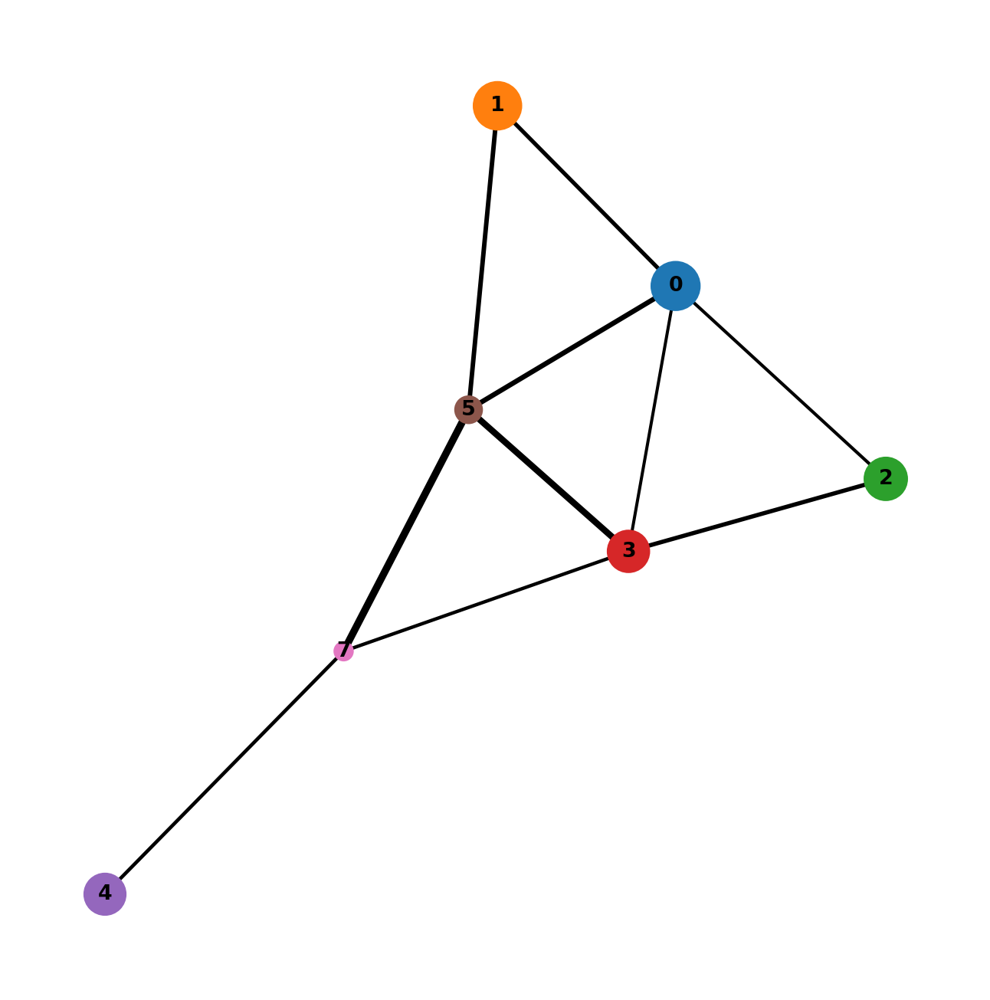

In [107]:
sc.tl.paga(adataneigh2,groups='niches')
sc.pl.paga(adataneigh2,color='niches',threshold=0.23,edge_width_scale=0.55,save='niche_paga.pdf')

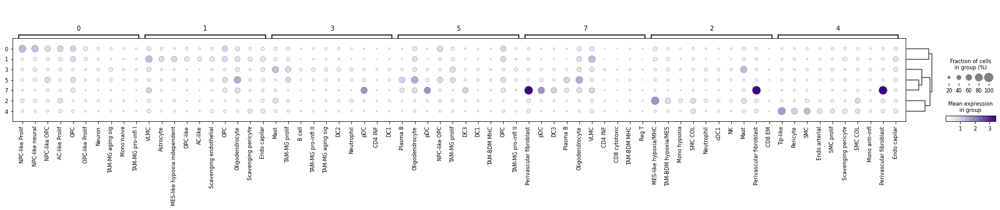

In [29]:
sc.tl.rank_genes_groups(adataneigh2,groupby='niches')
sc.pl.rank_genes_groups_dotplot(adataneigh2,cmap='Purples')

Now we calculate and represent as a heatmap the composition of each niche

In [206]:
expression=pd.DataFrame(adataneigh2.raw.X,columns=adataneigh2.raw.var.index)
expression['niche']=list(adataneigh2.obs['niches'])
mean_expression=expression.groupby('niche').mean()
max_cols = mean_expression.apply(lambda x: x.argmax(), axis=0)
max_cols = max_cols.sort_values().index
# reorder dataframe columns based on max_cols
df = mean_expression.loc[:, max_cols]
norm_df=df
sel=norm_df.loc[:,norm_df.max(axis=0)>0.3].columns

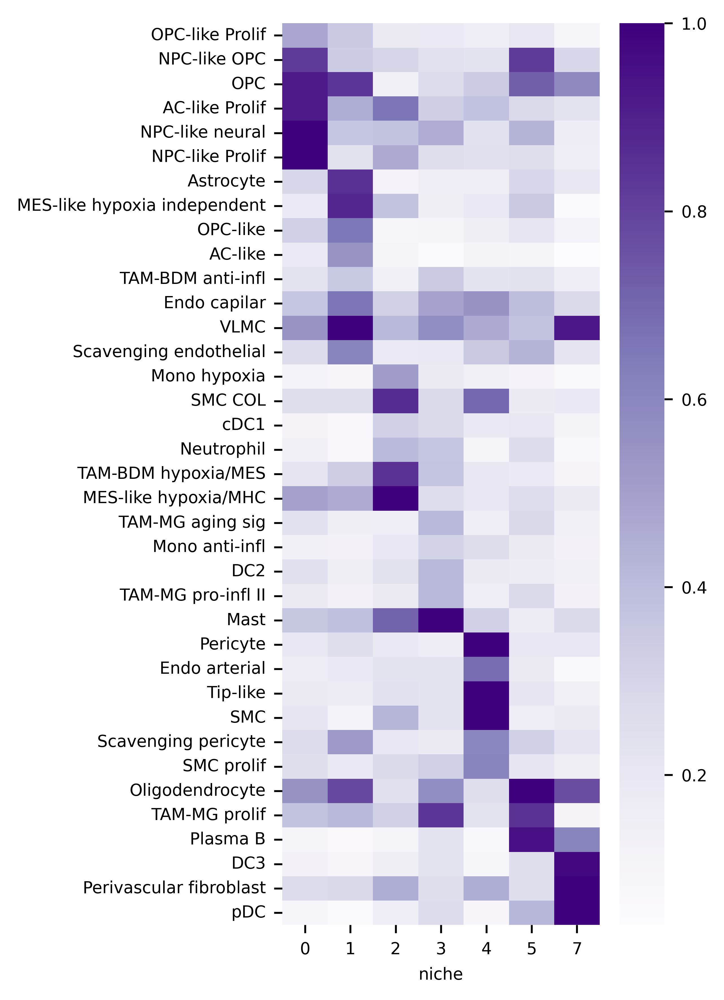

In [254]:
plt.figure(figsize=(3,7))
sns.heatmap(df.loc[:,sel].transpose(),cmap='Purples',vmax=1)
plt.savefig(general_path+'/ISS_global_analysis/niches_celltypes_heatmap.pdf')

<AxesSubplot:xlabel='niche'>

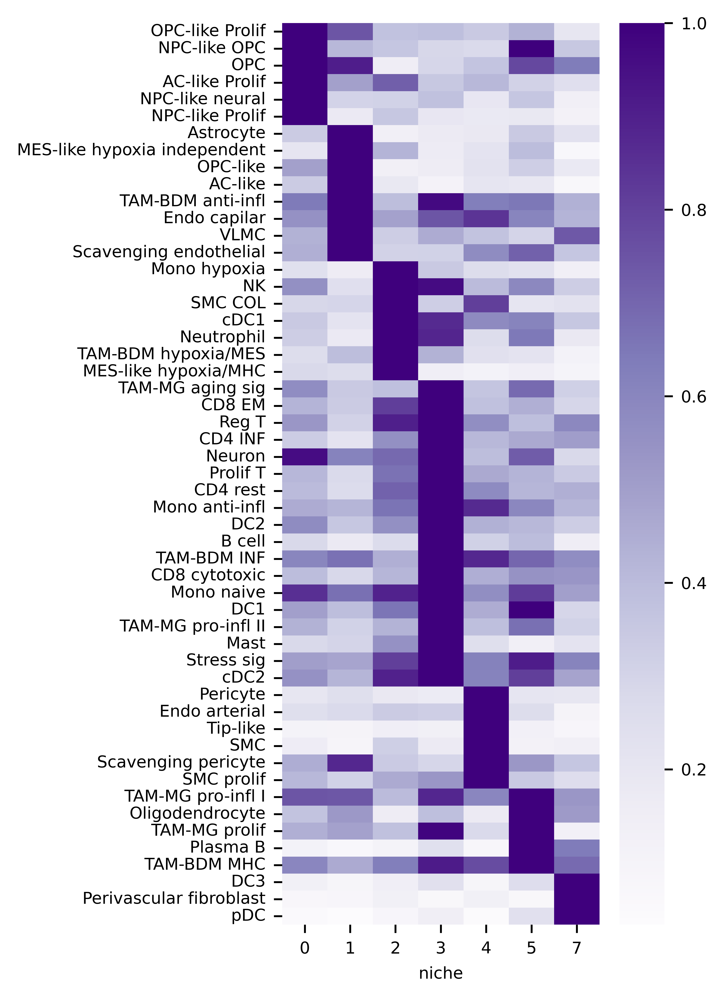

In [333]:
df2=df.div(df.max(axis=0),axis=1) # we now plot it again, but normalizing by cell type
plt.figure(figsize=(3,7))
sns.heatmap(df2.loc[:,:].transpose(),cmap='Purples',vmax=1)

We color the nichs accordingly

In [39]:
adataneigh2.uns['niches_colors']=['#459A6C','#6CE0EF',
                                  '#E8A262','#B3CD6B','#EF6EA8','#9E71F4','#71727C']

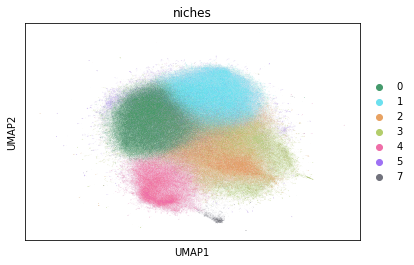

In [42]:
sc.pl.umap(adataneigh2,color='niches')

We also visualze the cell types on top of the umap, but it's pretty messy

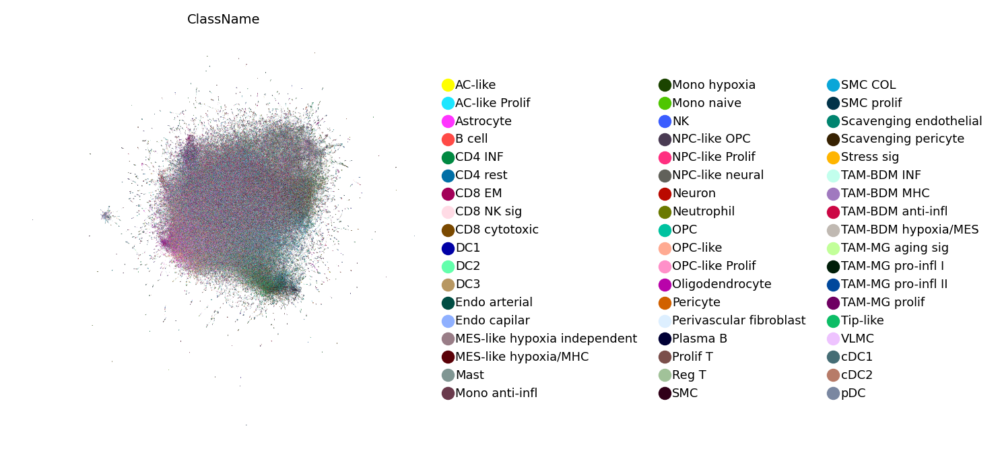

In [292]:
sc.pl.umap(adataneigh,color='ClassName')#,color='leiden')

We also visualize the niches spatially

In [ ]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=800, dpi_save=800, frameon=False, vector_friendly=True, fontsize=7, figsize=(8,8), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
for s in adataneigh2.obs['sample'].unique():
    ad_sub=adataneigh2[adataneigh2.obs['sample']==s]
    ad_sub.uns['niches_colors']=adataneigh2.uns['niches_colors']
    sq.gr.spatial_neighbors(ad_sub, spatial_key='spatial', library_key=None, coord_type='generic', n_neighs=15)
    sc.pl.spatial(ad_sub,spot_size=60,color='niches',vmax=40,sort_order=False,show=True,title=s,edges=True,edges_width=0.02,neighbors_key='spatial_neighbors')
    plt.savefig(general_path+'/ISS_global_analysis/modules/niche_map_'+str(s)+'.pdf')
    plt.show()

In [ ]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=500, dpi_save=500, frameon=False, vector_friendly=True, fontsize=7, figsize=(4,4), color_map=None, format='pdf', transparent=False, ipython_format='png2x',facecolor=None)
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
for s in adataneigh2.obs['sample'].unique()[0:1]:
    ad_sub=adataneigh2[adataneigh2.obs['sample']==s]
    ad_sub.uns['niches_colors']=adataneigh2.uns['niches_colors']
    sq.gr.spatial_neighbors(ad_sub, spatial_key='spatial', library_key=None, coord_type='generic', n_neighs=15)
    sc.pl.spatial(ad_sub,spot_size=30,color='niches',vmax=40,sort_order=False,show=False,title=s,edges=True,edges_width=0.05,neighbors_key='spatial_neighbors',edges_color='white')
    plt.xlim([10000,15000])
    plt.ylim([10000,15000])
    plt.savefig(general_path+'/ISS_global_analysis/modules/niche_map_'+str(s)+'_for_black_background_subset.pdf')
    plt.show()
sc.set_figure_params(scanpy=True, dpi=400, dpi_save=400, frameon=False, vector_friendly=True, fontsize=7, figsize=(4,4), color_map=None, format='pdf', transparent=False, ipython_format='png2x',facecolor=None)

We save if needed the object with defined niches

In [39]:
adataneigh.write(general_path+'/ISS_global_analysis/all_samples_niches_v3_TENTATIVE_FOR_PUBLICATION.h5ad') # should be with colors

# We define the proportion of niches across samples

In [34]:
adataneigh=sc.read(general_path+'/ISS_global_analysis/all_samples_niches_v3_TENTATIVE_FOR_PUBLICATION.h5ad') # should be with colors

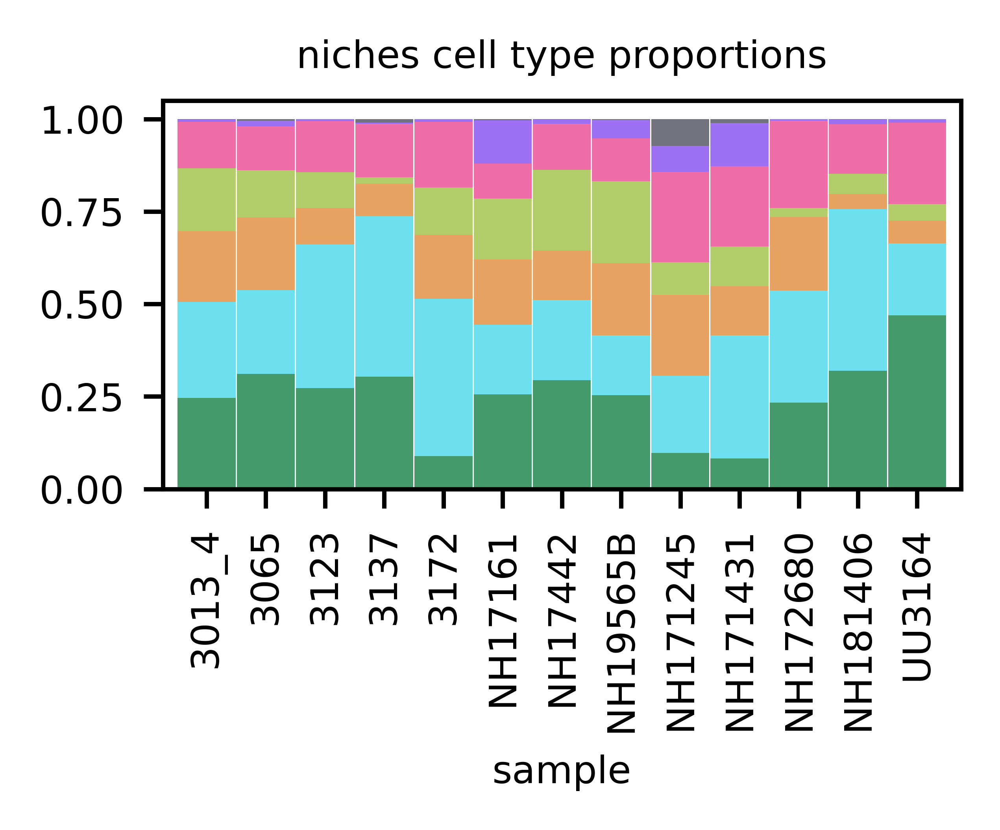

In [328]:
grouping='niches'

sc.set_figure_params(scanpy=True, dpi=500, dpi_save=500, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
ct_by_sample=pd.crosstab(adataneigh2.obs['sample'],adataneigh2.obs[grouping])
cts=ct_by_sample.div(ct_by_sample.sum(axis=1),axis=0)
cls_dic=dict(zip(np.unique(adataneigh2.obs[grouping]),adataneigh2.uns[grouping+'_colors']))

cts.plot(kind='bar',stacked=True,color=cts.columns.map(dictiocol),legend=False,figsize=(len(cts.index)*0.2,1.3),width=0.98)
plt.grid(False)
plt.title(grouping + ' cell type proportions')
plt.savefig(general_path+'/ISS_global_analysis/proportions_niches_'+grouping+'.pdf')

In [31]:
# in this chunk of code we find the order of the columns so that it follows its max values in rows.
expr=adataneigh.to_df()
expr['leiden_10']=adataneigh.obs['leiden_10']
df=expr.groupby('leiden_10').mean()
df=df.transpose()
max_cols = df.apply(lambda x: x.argmax(), axis=1)
max_cols = max_cols.sort_values().index
# reorder dataframe columns based on max_cols
df = df.loc[max_cols,:]
# the correct order will be in df.index

In [114]:
adataneigh2=adataneigh[adataneigh.obs['leiden_2'].isin(['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14'])]

In [115]:
sc.tl.rank_genes_groups(adataneigh2,groupby='leiden_2')
sc.pl.rank_genes_groups(adataneigh2,cmap='Purples')

In [117]:
neighplot=adataneigh2.to_df()

In [118]:
neighplot['leiden_2']=adataneigh2.obs['leiden_2']

In [120]:
mean_neigh=neighplot.groupby('leiden_2').mean()

In [121]:
sns.clustermap(mean_neigh,figsize=(15,7),cmap='Purples',standard_scale=1)

# Incorporating_regional_info

In [4]:
adata_regional=sc.read(general_path+'/ISS_global_analysis/all_samples_regional_GBMAP_modules.h5ad')
#adata_regional=sc.read(general_path+'/ISS_global_analysis/all_samples_regional_with_ivygap_updated.h5ad')

In [8]:
adataneigh2=adataneigh
adataneigh.obs['UNI_ID']=adataneigh.obs.index.astype(str)+'_'+adataneigh.obs['sample'].astype(str)
adataneigh2.obs['UNI_ID']=adataneigh2.obs.index.astype(str)+'_'+adataneigh2.obs['sample'].astype(str)
adata_regional.obs['UNI_ID']=adata_regional.obs.index.astype(str)+'_'+adata_regional.obs['sample'].astype(str)
adata_regional_filt=adata_regional[adata_regional.obs['UNI_ID'].isin(adataneigh2.obs['UNI_ID'])]
adataneigh2_filt=adataneigh2[adataneigh2.obs['UNI_ID'].isin(adata_regional.obs['UNI_ID'])]

In [ ]:
nich=pd.merge(adata_regional_filt.obs,adataneigh2_filt.obs,on='UNI_ID')
adata_regional_filt.obs['niches']=list(nich['niches'])

In [303]:
niche_vs_signature=pd.crosstab(adata_regional_filt.obs['niches'].astype(int),adata_regional_filt.obs['maximum_signature'])

In [ ]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=100, frameon=False, vector_friendly=True, fontsize=7, figsize=(4,4), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
for s in adata_regional_filt.obs['sample'].unique():
    ad_sub=adata_regional_filt[adata_regional_filt.obs['sample']==s]
   # ad_sub.uns['leiden_10_colors']=adataneigh.uns['leiden_10_colors']
    sc.pl.spatial(ad_sub,spot_size=100,color='niches',vmax=40,show=False,title=s)
    sc.pl.spatial(ad_sub,spot_size=100,color='maximum_signature',vmax=40,show=False,title=s)
    plt.show()
    #plt.savefig(general_path+'/ISS_global_analysis/modules/niche_map_'+str(s)+'.pdf')

In [305]:
nvs_norm=niche_vs_signature.div(niche_vs_signature.sum(axis=0),axis=1)
nvs_norm=nvs_norm.div(nvs_norm.sum(axis=1),axis=0)

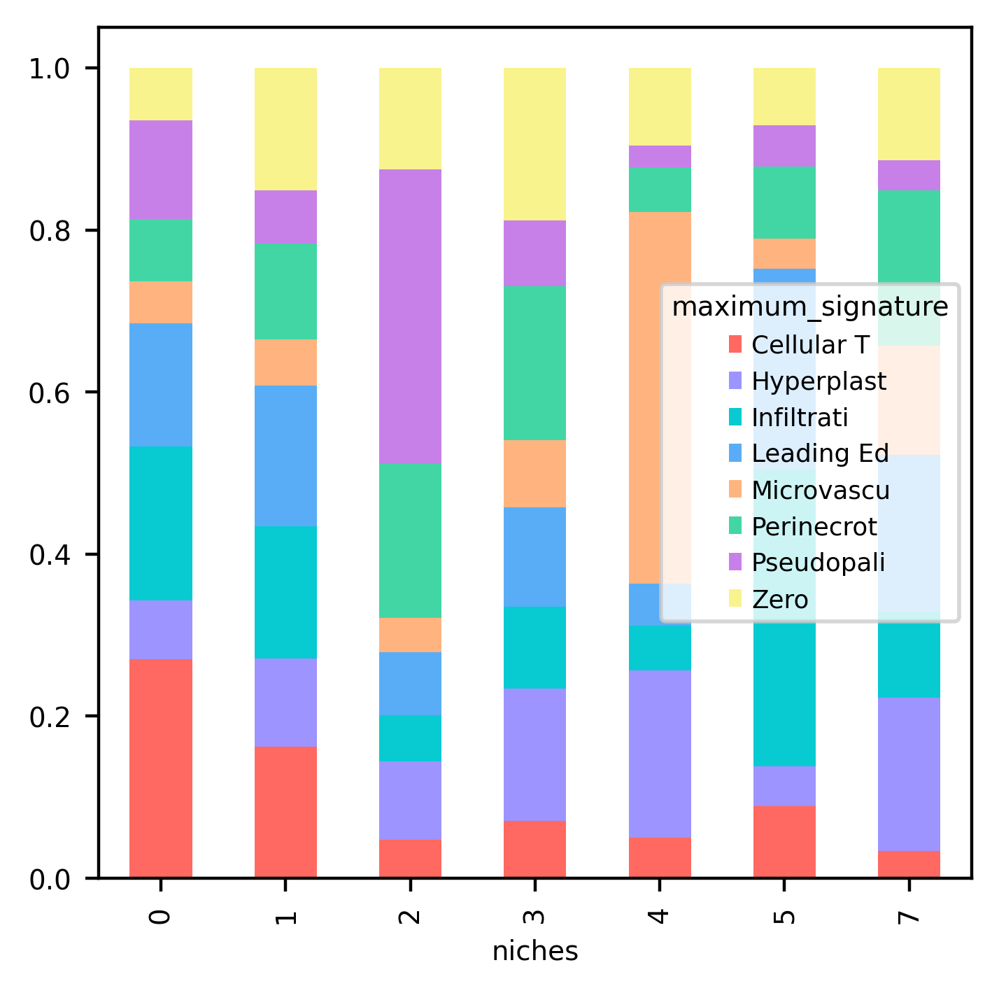

In [314]:
nvs_norm.plot(kind='bar',stacked=True,grid='off',color=['#ff6961','#9d94ff','#08cad1',
                                                       '#59adf6','#ffb480','#42d6a4','#c780e8','#f8f38d'])
plt.grid(b=None)
plt.savefig(general_path+'/ISS_global_analysis/modules/ivygap_to_niche.pdf')

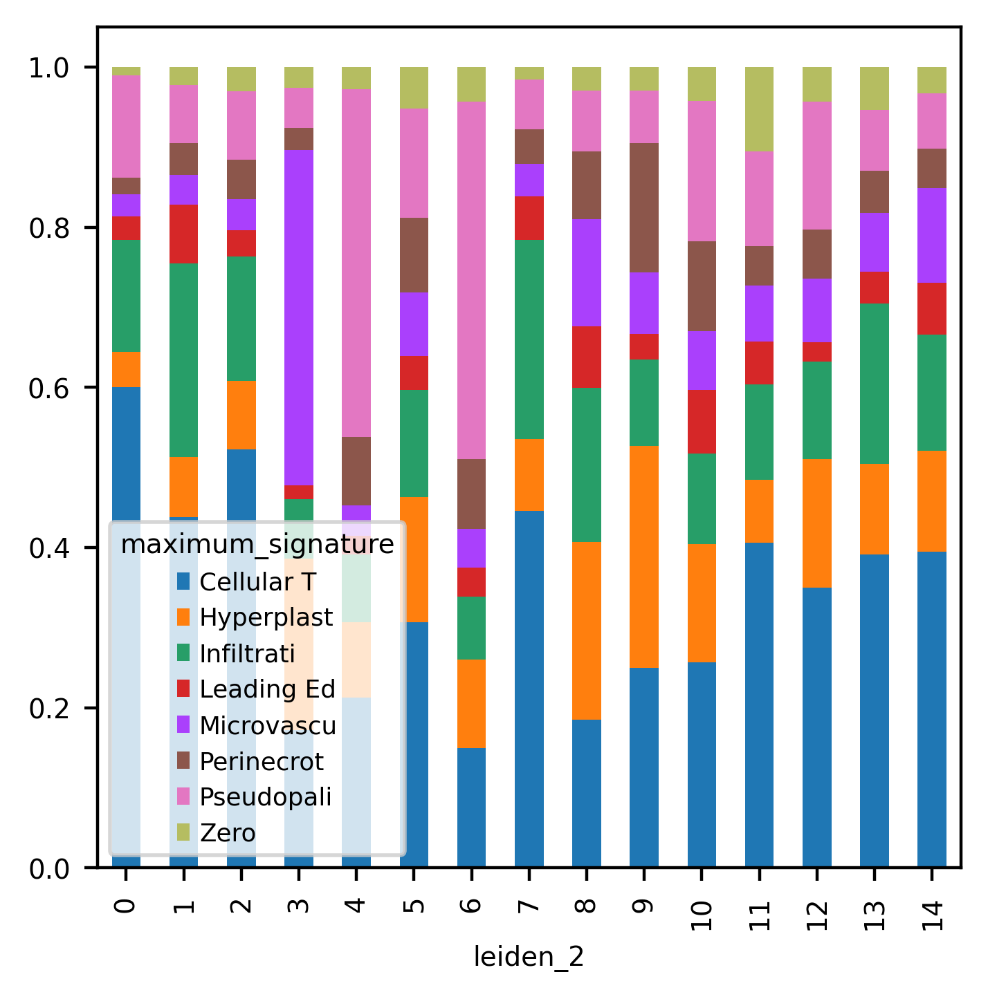

In [144]:
nvs_norm.plot(kind='bar',stacked=True,grid='off')
plt.grid(b=None)

In [141]:
sns.clustermap(nvs_norm)